**Importing all the important libraries required for to load,analyse and train the model**

In [1]:
import pandas as pd
import numpy as np
import pickle
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.pipeline import Pipeline

In [2]:
import warnings
warnings.filterwarnings("ignore")

Loading the data set

In [3]:
df=pd.read_csv("WA_Fn-UseC_-HR-Employee-Attrition.csv")

In [4]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


Fetching the information

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

Describing the data

In [6]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


Checking the null values in the data set

In [7]:
#As we can see it doesn't contain any  null values
df.isna().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

Analysing and visualizing the data

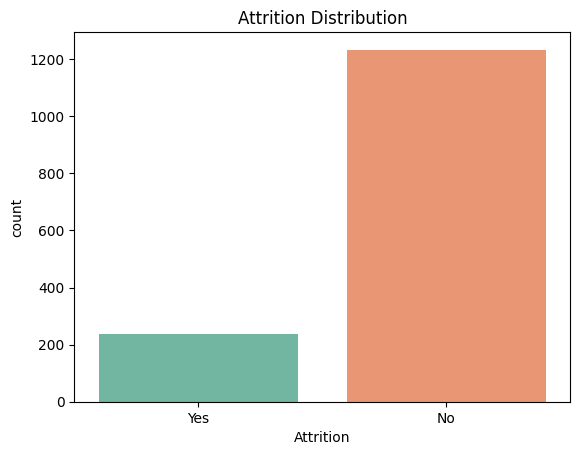

Attrition
No     83.877551
Yes    16.122449
Name: proportion, dtype: float64


In [8]:
#Target variable analysis
sns.countplot(x="Attrition", data=df, palette="Set2")
plt.title("Attrition Distribution")
plt.show()

# Percentage
print(df["Attrition"].value_counts(normalize=True) * 100)

Numeric column analysis

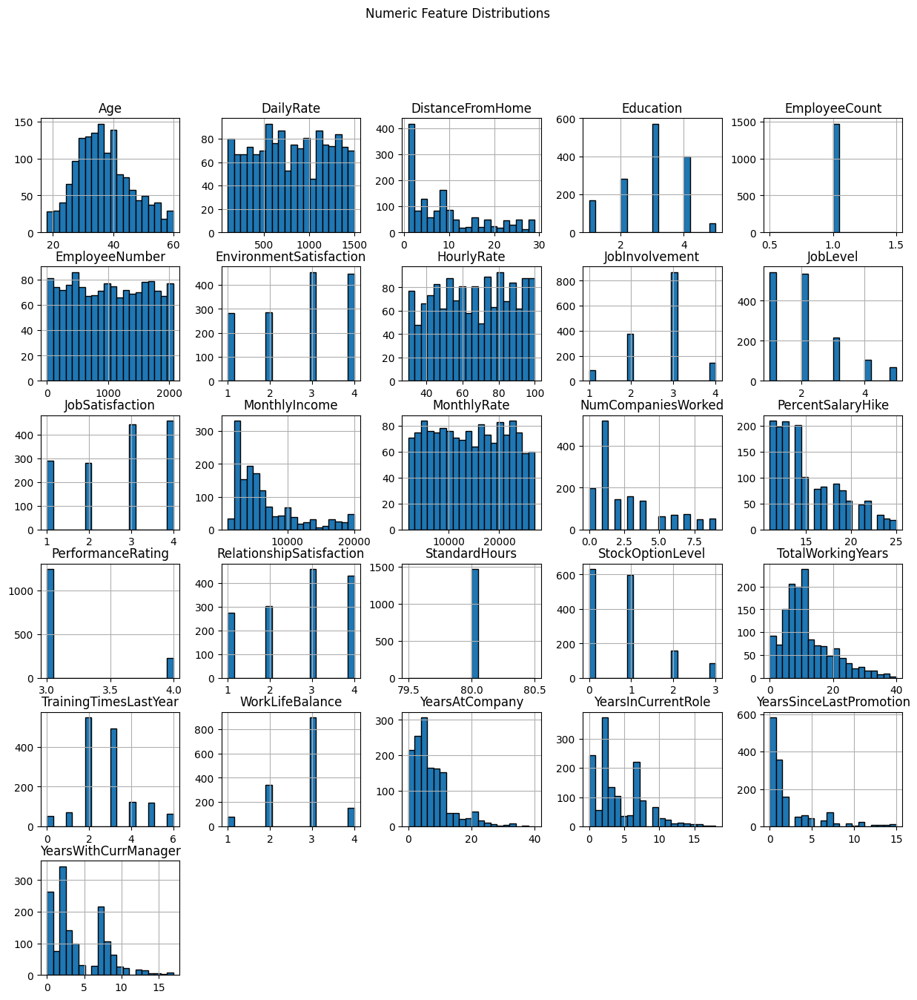

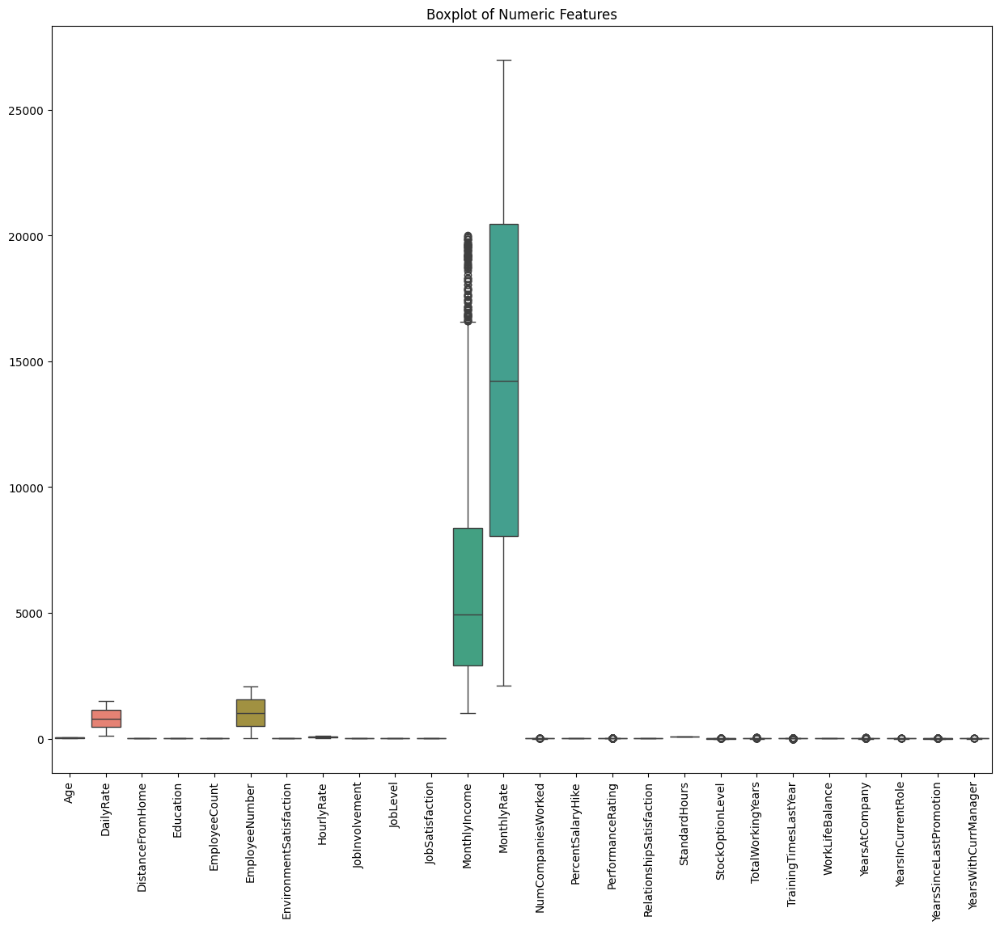

In [9]:
# Histograms
df.hist(figsize=(15,15), bins=20, edgecolor="black")
plt.suptitle("Numeric Feature Distributions")
plt.show()

# Boxplots for outliers
plt.figure(figsize=(15,12))
sns.boxplot(data=df.select_dtypes(include=["int64", "float64"]))
plt.xticks(rotation=90)
plt.title("Boxplot of Numeric Features")
plt.show()

Chategorical column analysis

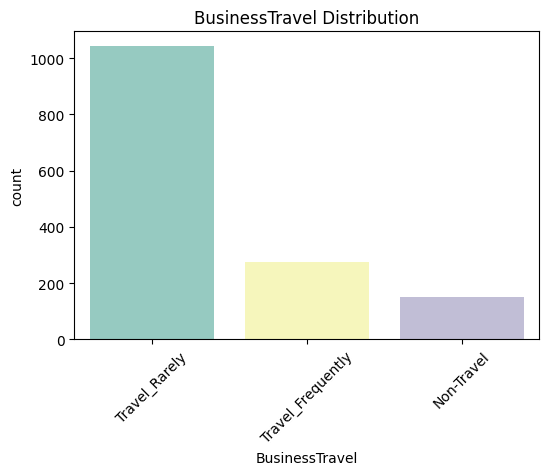

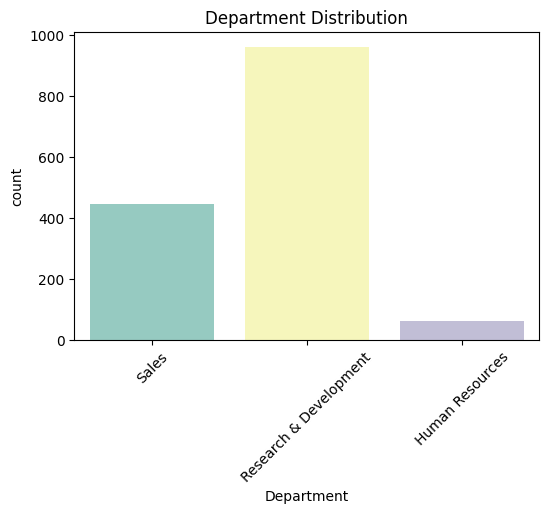

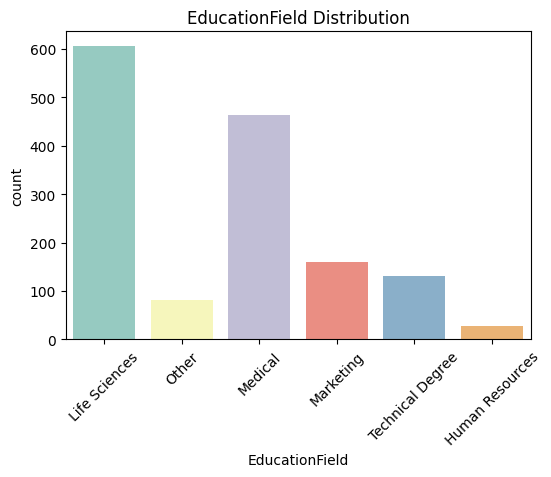

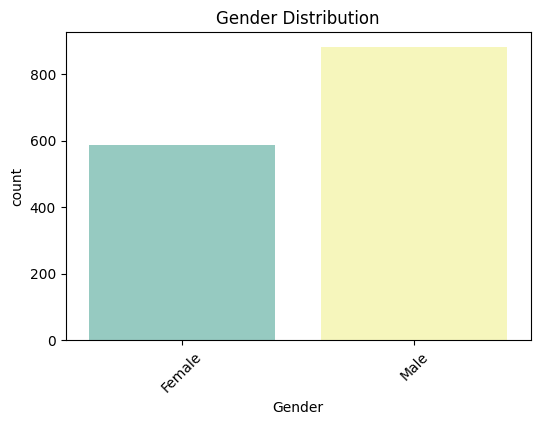

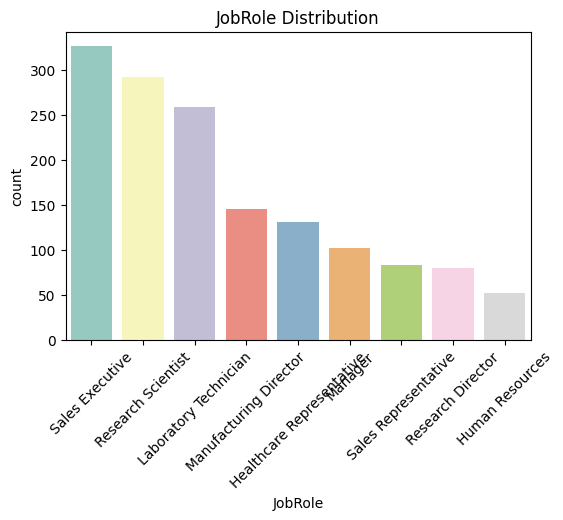

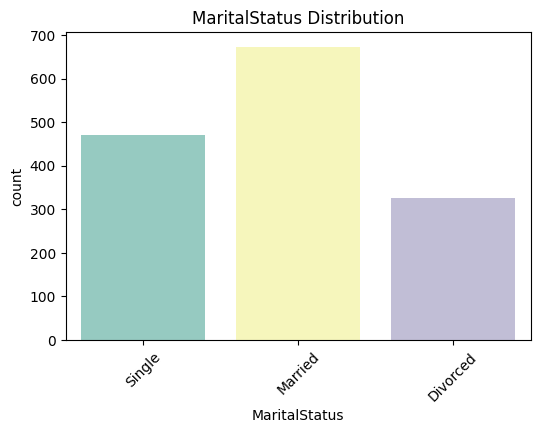

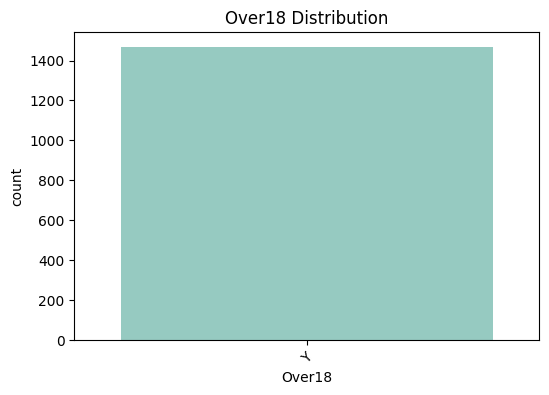

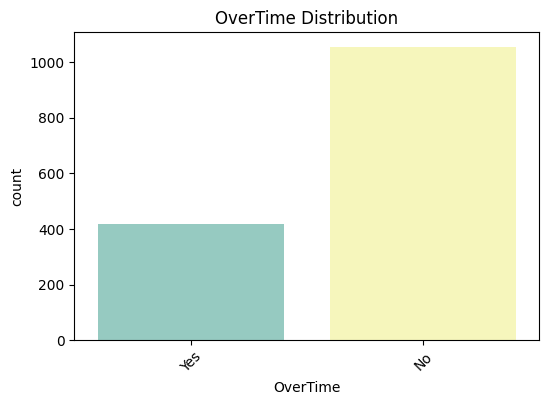

In [10]:
# Countplots for categorical variables
categorical_cols = df.select_dtypes(include=["object"]).columns.drop("Attrition")

for col in categorical_cols:
    plt.figure(figsize=(6,4))
    sns.countplot(x=col, data=df, palette="Set3")
    plt.title(f"{col} Distribution")
    plt.xticks(rotation=45)
    plt.show()

Analysing the data set with the help of pair plot

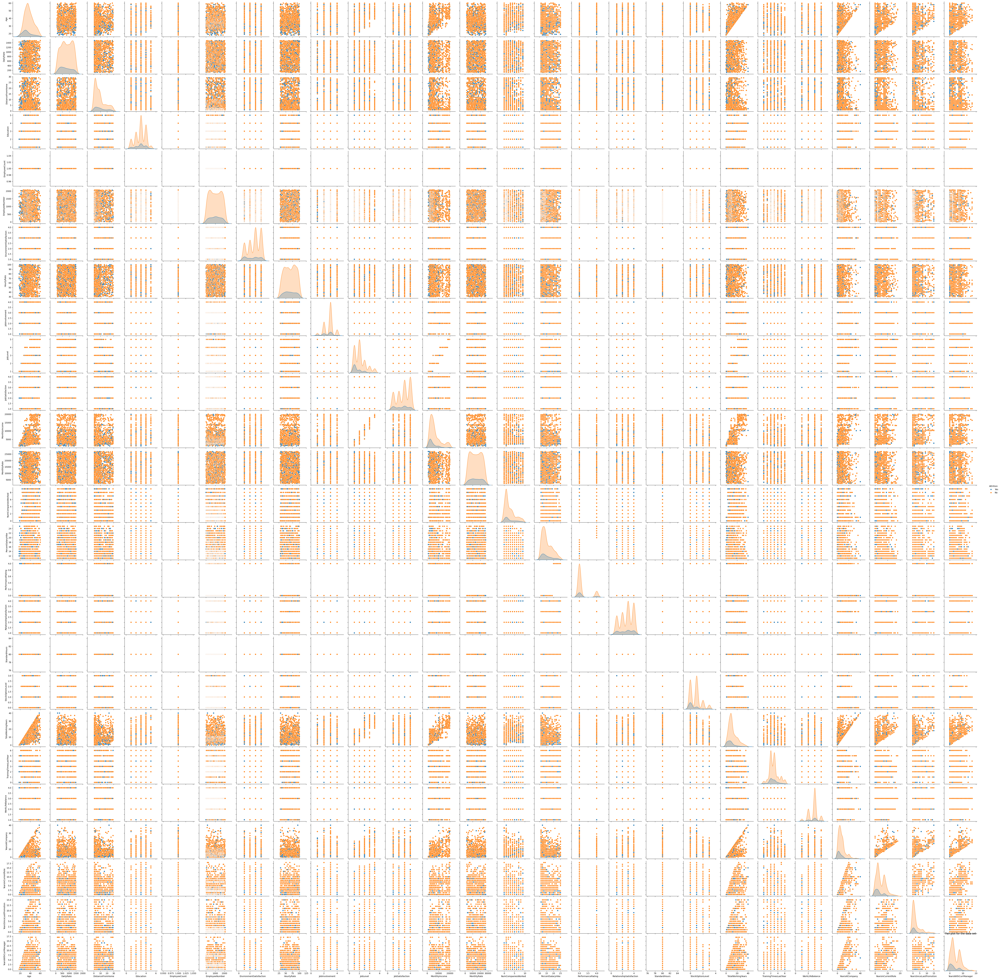

In [11]:
sns.pairplot(df,hue="Attrition")
plt.title("Pair plot for the data set")
plt.show()

**Feature Extraction**

Dropping Useless Columns

In [12]:
# Drop columns with no variance or identifiers
df = df.drop(columns=["EmployeeNumber", "EmployeeCount", "StandardHours", "Over18"])

Encoding Target Column

In [13]:
le = LabelEncoder()
df["Attrition"] = le.fit_transform(df["Attrition"])  # Yes=1, No=0

Encoding Categorical Features

In [14]:
categorical_cols = df.select_dtypes(include=["object"]).columns
df = pd.get_dummies(df, columns=categorical_cols, drop_first=True)

Handling the outliers from all input columns

In [15]:
def remove_outliers_iqr(data, cols):
    for col in cols:
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        data[col] = np.where(data[col] < lower, lower,
                    np.where(data[col] > upper, upper, data[col]))
    return data

In [16]:
num_cols = df.select_dtypes(include=["int64", "float64"]).columns.drop("Attrition")
df = remove_outliers_iqr(df, num_cols)

Feature Scalling

In [17]:
x = df.drop("Attrition", axis=1)
y = df["Attrition"]

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

In [18]:
df

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41.0,1,1102.0,1.0,2.0,2.0,94.0,3.0,2.0,4.0,...,False,False,False,False,False,True,False,False,True,True
1,49.0,0,279.0,8.0,1.0,3.0,61.0,2.0,2.0,2.0,...,False,False,False,False,True,False,False,True,False,False
2,37.0,1,1373.0,2.0,2.0,4.0,92.0,2.0,1.0,3.0,...,True,False,False,False,False,False,False,False,True,True
3,33.0,0,1392.0,3.0,4.0,4.0,56.0,3.0,1.0,3.0,...,False,False,False,False,True,False,False,True,False,True
4,27.0,0,591.0,2.0,1.0,1.0,40.0,3.0,1.0,2.0,...,True,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36.0,0,884.0,23.0,2.0,3.0,41.0,4.0,2.0,4.0,...,True,False,False,False,False,False,False,True,False,False
1466,39.0,0,613.0,6.0,1.0,4.0,42.0,2.0,3.0,1.0,...,False,False,False,False,False,False,False,True,False,False
1467,27.0,0,155.0,4.0,3.0,2.0,87.0,4.0,2.0,2.0,...,False,False,True,False,False,False,False,True,False,True
1468,49.0,0,1023.0,2.0,3.0,4.0,63.0,2.0,2.0,2.0,...,False,False,False,False,False,True,False,True,False,False


Train test spliting data

In [19]:
x_train, x_test, y_train, y_test = train_test_split(
    x_scaled, y, test_size=0.2, random_state=42
)

All model calling with loop and using dectionary

In [20]:
models = {
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42, n_estimators=200),
    "AdaBoost": AdaBoostClassifier(random_state=42, n_estimators=200),
    "XGBoost": XGBClassifier(random_state=42, use_label_encoder=False, eval_metric="logloss"),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42)
}

In [21]:
best_score = 0.0
best_model_name = None
best_pipeline = None

In [22]:
for name, clf in models.items():
    pipeline = Pipeline(steps=[
        ("scaler", StandardScaler()),   # scale features
        ("classifier", clf)
    ])

    pipeline.fit(x_train, y_train)
    y_pred = pipeline.predict(x_test)
    y_prob = pipeline.predict_proba(x_test)[:, 1] if hasattr(clf, "predict_proba") else None

    acc = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc = roc_auc_score(y_test, y_prob) if y_prob is not None else 0.0

    print(f"\n📊 {name} Results:")
    print(f"Accuracy : {acc:.4f}")
    print(f"F1 Score : {f1:.4f}")
    print(f"ROC-AUC  : {roc:.4f}")

    # Use ROC-AUC for best model (handles imbalance better)
    if roc > best_score:
        best_score = roc
        best_model_name = name
        best_pipeline = pipeline


📊 Decision Tree Results:
Accuracy : 0.7687
F1 Score : 0.2273
ROC-AUC  : 0.5517

📊 Random Forest Results:
Accuracy : 0.8741
F1 Score : 0.1395
ROC-AUC  : 0.7472

📊 AdaBoost Results:
Accuracy : 0.8673
F1 Score : 0.4000
ROC-AUC  : 0.7858

📊 XGBoost Results:
Accuracy : 0.8707
F1 Score : 0.3667
ROC-AUC  : 0.7746

📊 CatBoost Results:
Accuracy : 0.8912
F1 Score : 0.3333
ROC-AUC  : 0.7773


Saving best model

In [23]:
import joblib

print(f"\n✅ Best Model: {best_model_name} (ROC-AUC: {best_score:.4f})")
joblib.dump(best_pipeline, "best_attrition_model.pkl")
print("Best model saved as best_attrition_model.pkl")


✅ Best Model: AdaBoost (ROC-AUC: 0.7858)
Best model saved as best_attrition_model.pkl
